In [1]:
import pandas as pd
import numpy as np
import os
import sys
from collections import Counter
import gget
import scipy

from Bio import SeqIO
from Bio.KEGG import REST
from Bio.KEGG.KGML import KGML_parser

import scanpy as sc
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import seaborn as sns

"""WARNING: disabling future warnings"""
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

sys.path.append("../")
import utils as ut

In [2]:
# fpath = "/nfs/turbo/umms-indikar/shared/projects/HSC/data/single-cell/nov2023_run1/scanpy/anndata.h5ad"
# fpath = "/nfs/turbo/umms-indikar/shared/projects/HSC/data/single-cell/nov2023_run2/scanpy/anndata.h5ad"
# fpath = "/scratch/indikar_root/indikar1/cstansbu/all_scHSC/scanpy/anndata.h5ad"
# fpath = "/scratch/indikar_root/indikar1/cstansbu/all_scHSC_run3/scanpy/anndata.h5ad"
fpath = "/scratch/indikar_root/indikar1/cstansbu/all_scHSC_run4/scanpy/anndata.h5ad"


adata = sc.read(fpath, cache=False)
adata.layers["counts"] = adata.X.copy()
adata

AnnData object with n_obs × n_vars = 8572 × 19393
    obs: 'n_genes'
    var: 'gene_name', 'Chromosome', 'Start', 'End', 'Strand'
    layers: 'counts'

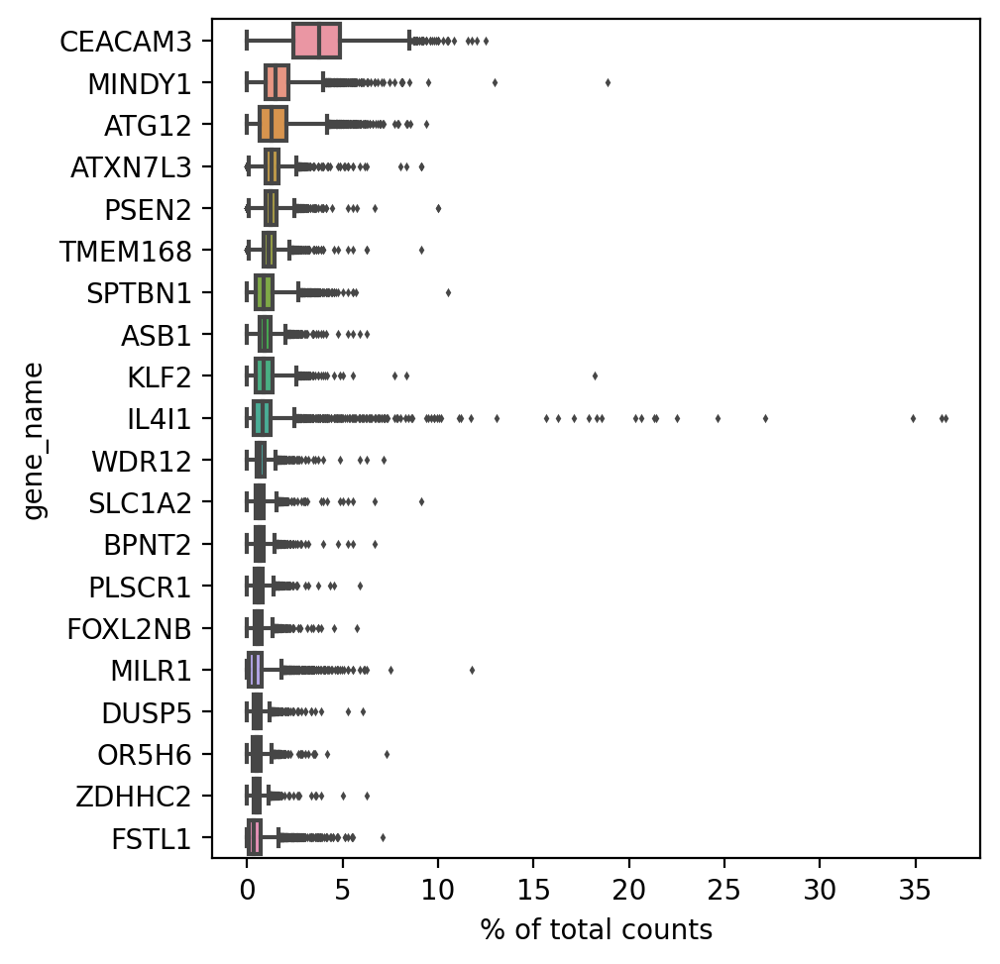

In [3]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 4, 4
sc.pl.highest_expr_genes(adata, n_top=20, gene_symbols='gene_name')

In [4]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

adata

AnnData object with n_obs × n_vars = 8343 × 13941
    obs: 'n_genes'
    var: 'gene_name', 'Chromosome', 'Start', 'End', 'Strand', 'n_cells'
    layers: 'counts'

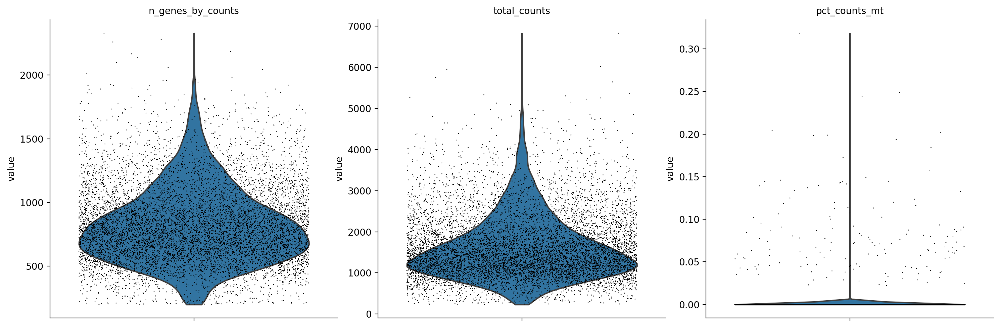

In [5]:
adata.var['mt'] = adata.var['gene_name'].str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, 
                           qc_vars=['mt'], 
                           percent_top=None,
                           log1p=False, 
                           inplace=True)

"""
A violin plot of some of the computed quality measures:

 - the number of genes expressed in the count matrix
 - the total counts per cell
 - the percentage of counts in mitochondrial genes
"""
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 3, 2.5
sc.pl.violin(adata, 
             ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, 
             multi_panel=True)

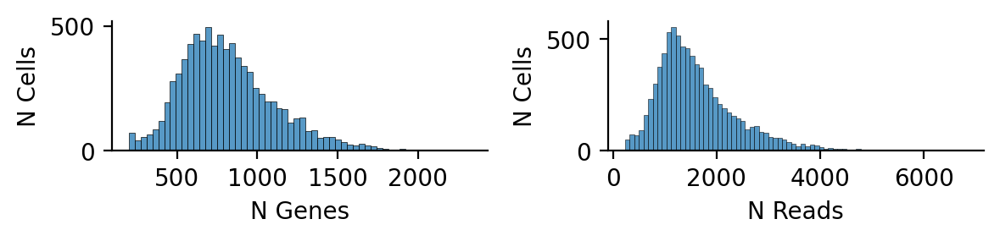

In [6]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 6, 1.5

fig, axs = plt.subplots(1, 2)

sns.histplot(data=adata.obs,
             x='n_genes_by_counts',
             ax=axs[0])

axs[0].set_ylabel('N Cells')
axs[0].set_xlabel('N Genes')

sns.histplot(data=adata.obs,
             x='total_counts',
             ax=axs[1])

axs[1].set_ylabel('N Cells')
axs[1].set_xlabel('N Reads')

sns.despine()
plt.tight_layout()

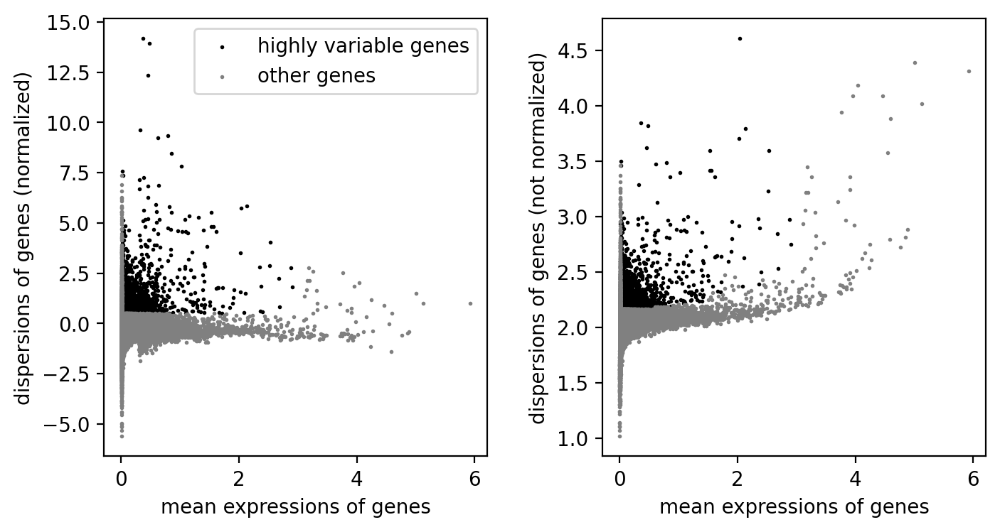

In [7]:
# preprocess
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 4, 4
sc.pl.highly_variable_genes(adata)

In [8]:
""" 
run3: 693.524794388002
"""
adata.obs['n_genes'].mean()

819.5326621119501

In [9]:
""" 
run3: 1297.1390904692792
"""
adata.obs['total_counts'].mean()

1623.5741340045547

In [10]:
# break

# Low dimensional embedding (PCA/UMAP)

2023-12-22 09:34:38.117793: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-12-22 09:34:38.317615: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-12-22 09:34:39.699820: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory
2023-12-22 09:34:39.699935: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such 

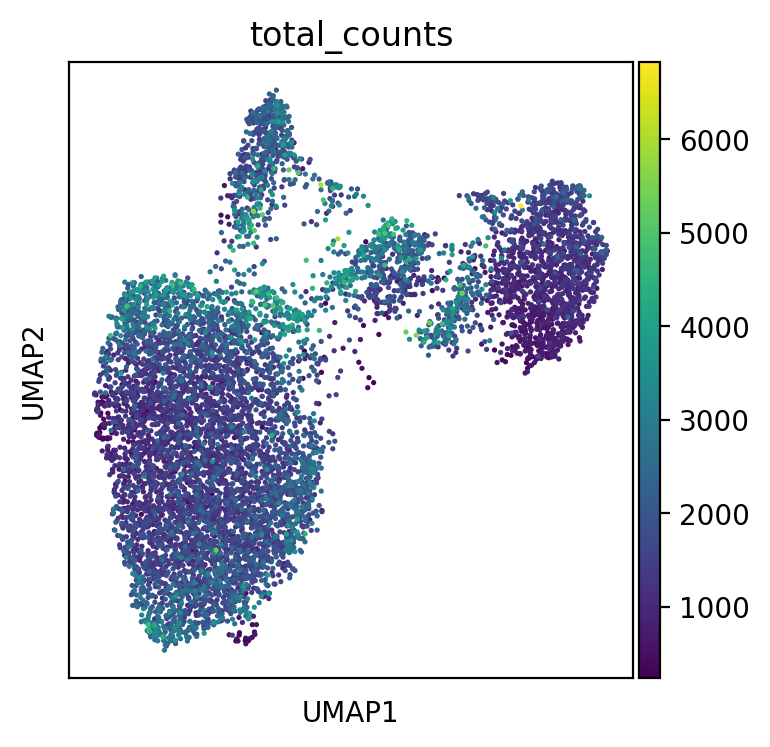

In [11]:
# mathematical processing
n_comps = 80
n_neighbors = 11
neighbors_n_pcs = 20
min_dist = 0.2
spread = 0.8

sc.tl.pca(adata, n_comps=n_comps, zero_center=True)
sc.pp.neighbors(adata, 
                n_neighbors=n_neighbors, 
                n_pcs=neighbors_n_pcs)

sc.tl.umap(adata, min_dist, spread)

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 4, 4
sc.pl.umap(adata, color='total_counts')


# add these columns to obs
adata.obs['UMAP 1'] = adata.obsm['X_umap'][:,0]
adata.obs['UMAP 2'] = adata.obsm['X_umap'][:,1]

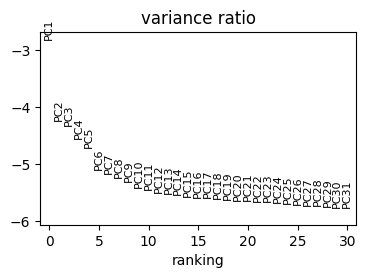

In [12]:
plt.rcParams['figure.dpi'] = 100
plt.rcParams['figure.figsize'] = 4, 2.5
sc.pl.pca_variance_ratio(adata, log=True)


In [13]:
# # Eigen analysis
# X = adata.X
# A = np.corrcoef(X)
# print(f"{A.shape=}")

# u, s, vh = np.linalg.svd(A)

# plt.plot(s[:20], marker="o", c='k')
# plt.yscale("log")
# plt.ylabel('Magnitude (log)')
# plt.xlabel('Eigenvalue')
# plt.title(r'Leading Eigenvalues of $\mathbf{A}$')
# sns.despine()

# Marker genes

In [14]:
def getGenes(pdf, cellType, ui_upper=None):
    genes = pdf[pdf['cell type'] == cellType]
    
    if not ui_upper is None:
        genes = genes[genes['ubiquitousness index'] < ui_upper]
    return genes['official gene symbol'].to_list()


pdfPath = "/nfs/turbo/umms-indikar/shared/projects/spatial_transcriptomics/data/panglaodb/pandb.tsv.gz"
pandDf = pd.read_csv(pdfPath, sep="\t")

fb = getGenes(pandDf, 'Fibroblasts')
hp = getGenes(pandDf, 'Hematopoietic stem cells')

print(f"FB genes: {len(fb)}")
print(f"HP genes: {len(hp)}")

print(Counter(fb + hp).most_common(5)) # there are three genes shared in both lists


marker_genes = {
    'Fibroblast' : adata.var[adata.var['gene_name'].isin(fb)].index,
    'HSC' : adata.var[adata.var['gene_name'].isin(hp)].index,
}

id2name = dict(zip(adata.var.index.values, adata.var['gene_name'].values))
name2id = dict(zip(adata.var['gene_name'].values, adata.var.index.values))

FB genes: 179
HP genes: 88
[('THY1', 2), ('CD44', 2), ('EGR1', 2), ('RUNX1', 2), ('IL1R1', 1)]


In [15]:
# make some observation columns
for k, v in marker_genes.items():
    print(k, v.shape)

    adata.obs[f"{k}_mean"] = adata[:, v].X.mean(axis=1).copy()
    adata.obs[f"{k}_max"] = adata[:, v].X.max(axis=1).copy()
    adata.obs[f"{k}_argmax"] = adata[:, v].X.argmax(axis=1).copy()
    adata.obs[f"{k}_highest_exp"] = adata.obs[f"{k}_argmax"].apply(lambda x : id2name[v[x]])

adata.obs.head()

Fibroblast (126,)
HSC (69,)


,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,UMAP 1,UMAP 2,Fibroblast_mean,Fibroblast_max,Fibroblast_argmax,Fibroblast_highest_exp,HSC_mean,HSC_max,HSC_argmax,HSC_highest_exp
cell_id,,,,,,,,,,,,,,,
AAACCCAAGGTTACCT,799,797,1436,0,0.0,1.920449,1.461942,0.205656,3.906940,121,KLF2,0.150355,2.074905,5,PTPRC
AAACCCAAGTTGAAGT,696,696,1120,0,0.0,1.628114,-2.031378,0.194177,4.398849,32,FSTL1,0.166335,2.295417,5,PTPRC
AAACCCAAGTTGTCGT,521,521,889,0,0.0,5.717063,1.781263,0.084707,3.156881,121,KLF2,0.036310,2.505411,22,GATA2
AAACCCACAGAAGCGT,490,490,735,0,0.0,8.472242,1.840626,0.050910,3.733287,121,KLF2,0.126123,3.339708,51,MGST1
AAACCCACAGGAGGTT,1320,1320,3043,0,0.0,0.020720,-2.154914,0.204987,4.781677,32,FSTL1,0.063279,1.455408,5,PTPRC


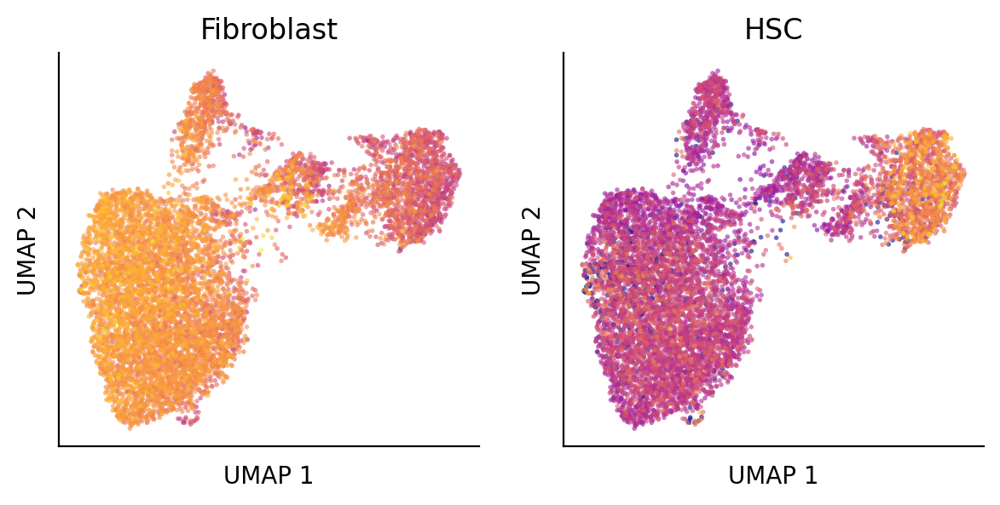

In [16]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 7, 3

pdf = adata.obs.copy()
fig, axs = plt.subplots(1, 2)

cmap = 'plasma'
size = 4
alpha = 0.6

# sort order
order1 = np.argsort(pdf['Fibroblast_max'])
order2 = np.argsort(pdf['HSC_max'])


sns.scatterplot(data=pdf.iloc[order1], 
                x='UMAP 1',
                y='UMAP 2',
                hue='Fibroblast_max',
                palette=cmap,
                alpha=alpha,
                ax=axs[0],
                s=size,
                ec='none')

axs[0].set_yticks([])
axs[0].set_xticks([])
axs[0].legend().remove()
axs[0].set_title('Fibroblast')

sns.scatterplot(data=pdf.iloc[order2], 
                x='UMAP 1',
                y='UMAP 2',
                hue='HSC_max',
                palette=cmap,
                alpha=alpha,
                ax=axs[1],
                s=size,
                ec='none')

axs[1].set_yticks([])
axs[1].legend().remove()
axs[1].set_xticks([])
axs[1].set_title('HSC')

sns.despine()

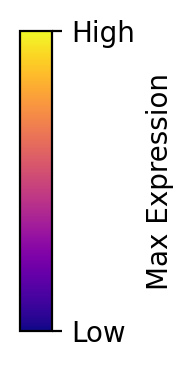

In [17]:
ut.makeColorbar('plasma', 0.2, 2.5, 'Max Expression', 'vertical', ['Low', 'High'])

In [18]:
# break

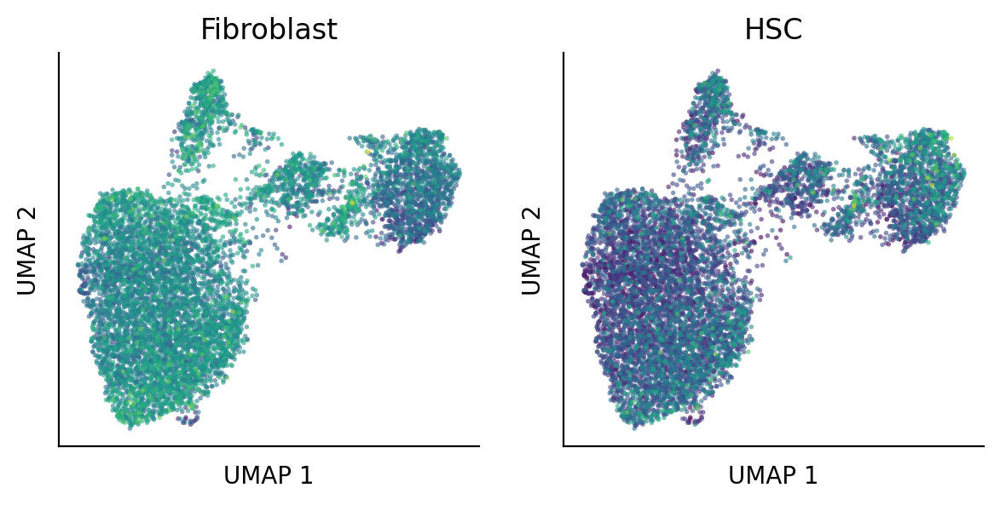

In [19]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 7, 3

pdf = adata.obs.copy()
fig, axs = plt.subplots(1, 2)

cmap = 'viridis'
size = 4
alpha = 0.6

# sort order
order1 = np.argsort(pdf['Fibroblast_mean'])
order2 = np.argsort(pdf['HSC_mean'])


sns.scatterplot(data=pdf.iloc[order1], 
                x='UMAP 1',
                y='UMAP 2',
                hue='Fibroblast_mean',
                palette=cmap,
                alpha=alpha,
                ax=axs[0],
                s=size,
                ec='none')

axs[0].set_yticks([])
axs[0].set_xticks([])
axs[0].legend().remove()
axs[0].set_title('Fibroblast')

sns.scatterplot(data=pdf.iloc[order2], 
                x='UMAP 1',
                y='UMAP 2',
                hue='HSC_mean',
                palette=cmap,
                alpha=alpha,
                ax=axs[1],
                s=size,
                ec='none')

axs[1].set_yticks([])
axs[1].legend().remove()
axs[1].set_xticks([])
axs[1].set_title('HSC')

sns.despine()

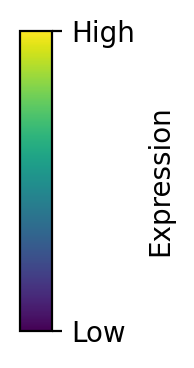

In [20]:
ut.makeColorbar('viridis', 0.2, 2.5, 'Expression', 'vertical', ['Low', 'High'])

In [21]:
break

# Clustering

... storing 'Fibroblast_highest_exp' as categorical
... storing 'HSC_highest_exp' as categorical


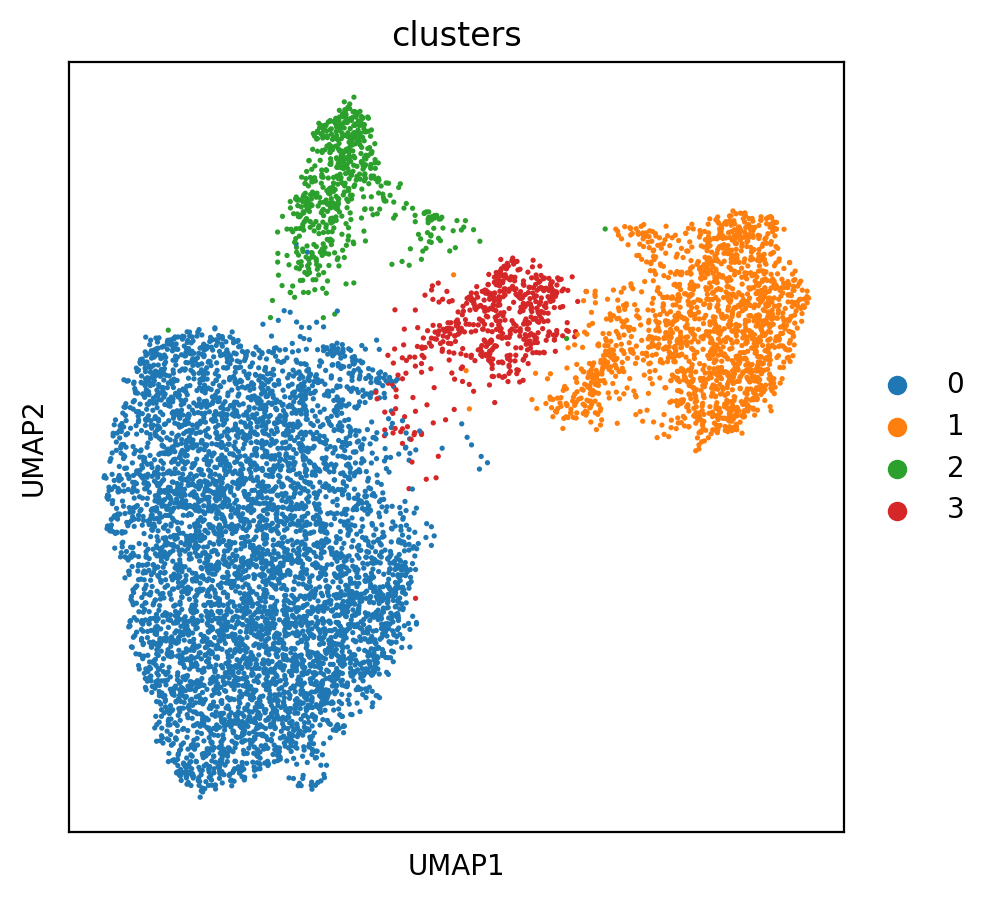

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,UMAP 1,UMAP 2,Fibroblast_mean,Fibroblast_max,Fibroblast_argmax,Fibroblast_highest_exp,HSC_mean,HSC_max,HSC_argmax,HSC_highest_exp,clusters
cell_id,,,,,,,,,,,,,,,,
AAACCCAAGGTTACCT,799,797,1436,0,0.0,1.920449,1.461942,0.205656,3.906940,121,KLF2,0.150355,2.074905,5,PTPRC,0
AAACCCAAGTTGAAGT,696,696,1120,0,0.0,1.628114,-2.031378,0.194177,4.398849,32,FSTL1,0.166335,2.295417,5,PTPRC,0
AAACCCAAGTTGTCGT,521,521,889,0,0.0,5.717063,1.781263,0.084707,3.156881,121,KLF2,0.036310,2.505411,22,GATA2,1
AAACCCACAGAAGCGT,490,490,735,0,0.0,8.472242,1.840626,0.050910,3.733287,121,KLF2,0.126123,3.339708,51,MGST1,1
AAACCCACAGGAGGTT,1320,1320,3043,0,0.0,0.020720,-2.154914,0.204987,4.781677,32,FSTL1,0.063279,1.455408,5,PTPRC,0


In [22]:
# clustering 
resolution = 0.3
key = f"clusters"
sc.tl.leiden(adata, 
             resolution=resolution,
             key_added=key)


plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 5, 5
sc.pl.umap(adata, color=["clusters",])

adata.obs.head()

In [23]:
# break

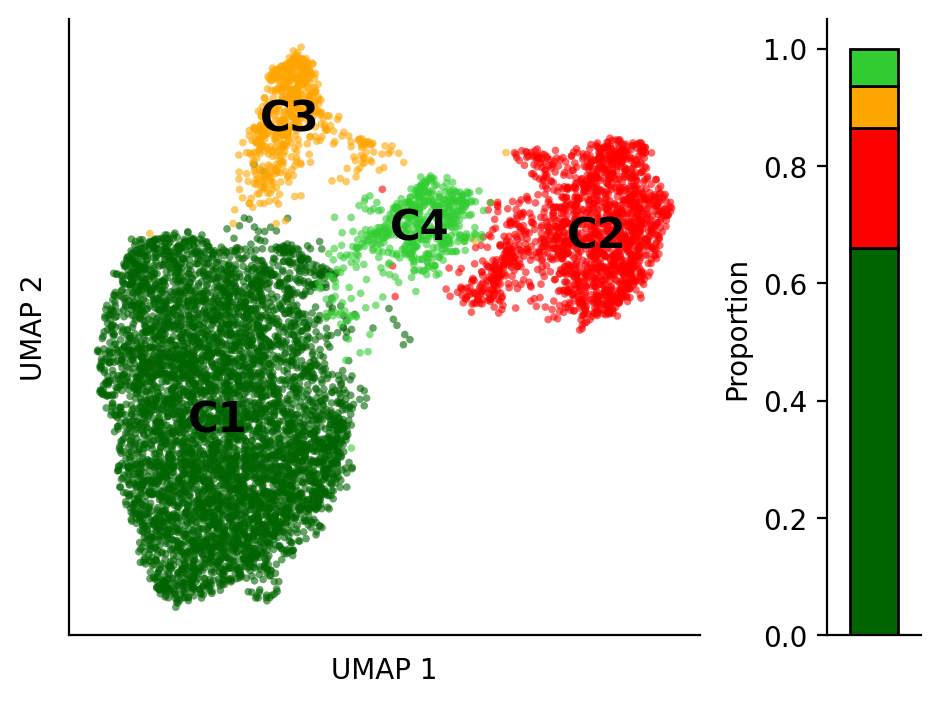

In [24]:
pdf = adata.obs.copy()
pdf['cluster_name'] = pdf['clusters'].astype(int).apply(lambda x: f"C{x+1}")
pdf = pdf.sort_values(by='cluster_name')

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 5.5, 4

colors = ['darkgreen', 'red', "orange", "limegreen"]
size = 7.5
alpha = 0.6

sns.scatterplot(data=pdf, 
                x='UMAP 1',
                y='UMAP 2',
                hue='cluster_name',
                palette=colors,
                alpha=alpha,
                s=size,
                ec='none')



plt.yticks([])
plt.xticks([])

# label on data
ax = plt.gca()

all_pos = (
        pdf.groupby('cluster_name')[['UMAP 1', 'UMAP 2']]
        .median()
        .sort_index()
    )

for label, x_pos, y_pos in all_pos.itertuples():
    ax.text(
        x_pos,
        y_pos,
        label,
        weight='bold',
        verticalalignment="center",
        horizontalalignment="center",
        fontsize='15',
    )

ax = plt.gca()
ax.legend().remove()

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="15%")

t = adata.obs['clusters'].value_counts(normalize=True).reset_index(drop=False).T
new_header = t.iloc[0] 
t = t[1:]
t.columns = ['C1', 'C2', 'C3', 'C4']
t.plot(kind='bar', 
       stacked=True,
       legend=False,
       color=colors,
       ax=cax,
       ec='k')

cax.set_xlabel("")
cax.set_xticks([])
cax.set_ylabel("Proportion")

sns.despine()

In [25]:
print(sorted(fb))

['ABI3', 'ACKR3', 'ADAM33', 'ADAMTS10', 'ADAMTS5', 'ADGRE4', 'AKR1C18', 'ANGPTL2', 'ARAP1', 'ASPN', 'C1S', 'CCL11', 'CCL19', 'CCR2', 'CD209A', 'CD248', 'CD300E', 'CD40', 'CD44', 'CD55', 'CDH11', 'CEBPB', 'CELA1', 'CKAP4', 'CLEC3B', 'COL12A1', 'COL13A1', 'COL14A1', 'COL15A1', 'COL1A1', 'COL1A2', 'COL3A1', 'COL4A3', 'COL4A4', 'COL5A1', 'COL5A2', 'COL6A2', 'COL6A3', 'COL7A1', 'COL8A1', 'COPZ2', 'CTGF', 'CTHRC1', 'CTSK', 'CXCL14', 'CXCL3', 'CXCL8', 'CYP1B1', 'DCN', 'DDR2', 'DKK1', 'DKK3', 'DPEP1', 'DPT', 'EAR2', 'EDN3', 'EFEMP1', 'EGR1', 'ELN', 'EN1', 'ENO3', 'ENTPD2', 'ERCC1', 'FABP4', 'FAP', 'FBLN2', 'FBLN7', 'FBN1', 'FGF2', 'FGR', 'FIBIN', 'FKBP10', 'FKBP7', 'FLI1', 'FMO2', 'FN1', 'FOSB', 'FOSL2', 'FOXF1', 'FRZB', 'FSTL1', 'GJB2', 'GREM1', 'GSN', 'GSTM5', 'HAS1', 'HCK', 'HGF', 'HHIP', 'HIF1A', 'IGF1', 'IGFBP3', 'IGFBP6', 'IL1R1', 'IL34', 'IL6', 'INMT', 'ITGAL', 'ITIH5', 'KLF2', 'KLF4', 'KLF6', 'KLF9', 'LAMA2', 'LAMB1', 'LAMC1', 'LOX', 'LRRK1', 'LUM', 'LY6I', 'MDK', 'MEDAG', 'MEOX1', 'MF

CD55 ENSG00000196352
FSTL1 ENSG00000163430
CD34 ENSG00000174059
MGST1 ENSG00000008394


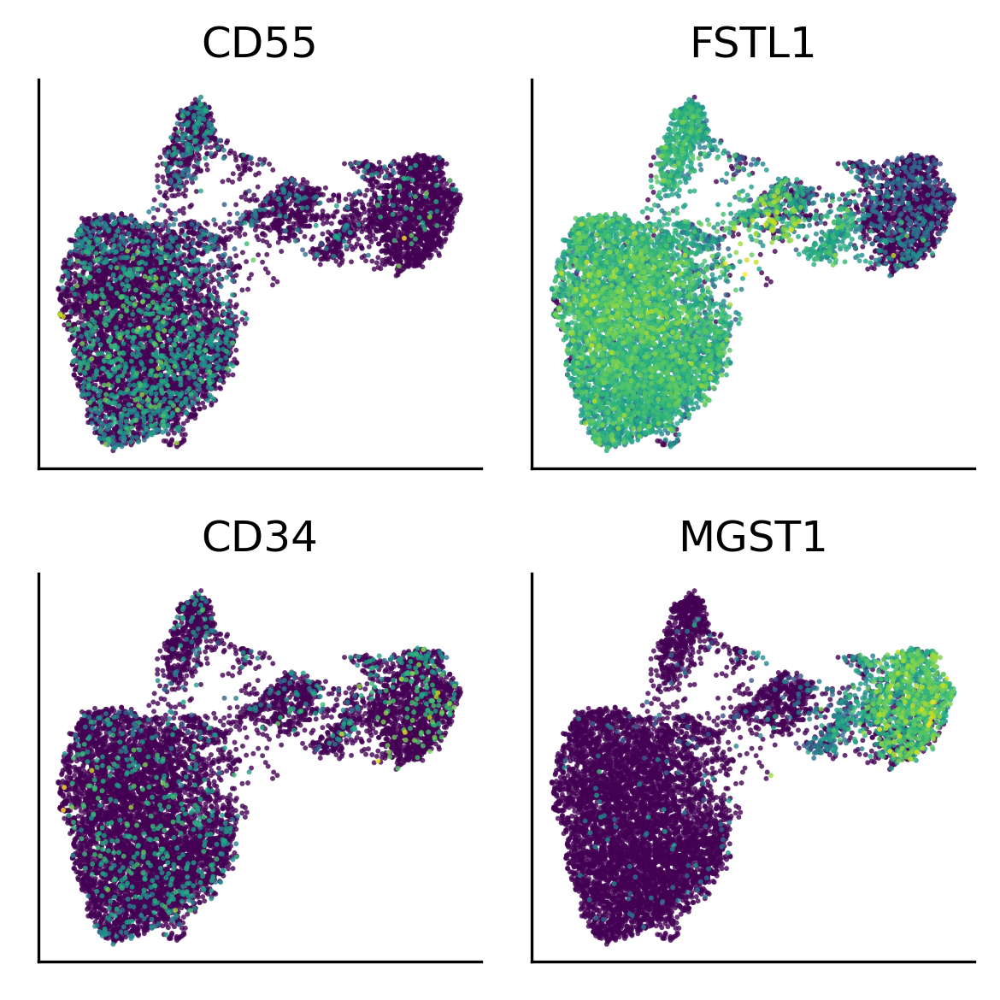

In [26]:
gene_list = [
    'CD55',
    'FSTL1',
    'CD34', 
    'MGST1', 
    
] # must be q square

n = len(gene_list)
pltn = int(np.sqrt(n))

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 4
fig, axs = plt.subplots(pltn, pltn)
axs = axs.ravel()

for i, g in enumerate(gene_list):
    gene_name = adata.var[adata.var['gene_name'] == g].index[0]
    print(g, gene_name)
    v = adata[:, [gene_name]].X.copy()


    gdf = adata.obs.copy()
    gdf['exp'] = np.ravel(v)

    order = np.argsort(gdf['exp'])


    axs[i].scatter(gdf['UMAP 1'][order], 
                   gdf['UMAP 2'][order],
                   c=gdf['exp'][order],
                   s=2,
                   alpha=0.8,
                   ec='none')
    
    axs[i].set_title(g)

    axs[i].set_xticks([])
    axs[i].set_yticks([])
    axs[i].set_xlabel("")
    axs[i].set_ylabel("")

sns.despine()
plt.tight_layout()

In [27]:
# break

# Highly expressed genes

In [28]:
res = []

for cluster in adata.obs['clusters'].unique():
    cdata = adata[adata.obs['clusters'] == cluster]
    cluster_name = f"C{int(cluster)+1}"

    gene_data = cdata.var.copy()

    gene_data['cluster'] = cluster_name
    gene_data['cluster_mean'] = np.ravel(cdata.X.mean(axis=0))
    gene_data['cluster_median'] = np.ravel(np.median(cdata.X, axis=0))
    gene_data['cluster_max'] = np.ravel(cdata.X.max(axis=0))

    gene_data['cluster_mean_rank'] = gene_data['cluster_mean'].rank(ascending=False)
    gene_data['cluster_median_rank'] = gene_data['cluster_median'].rank(ascending=False)
    gene_data['cluster_max_rank'] = gene_data['cluster_max'].rank(ascending=False)    

    res.append(gene_data)

res = pd.concat(res)
res.head()

,gene_name,Chromosome,Start,End,Strand,n_cells,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,...,means,dispersions,dispersions_norm,cluster,cluster_mean,cluster_median,cluster_max,cluster_mean_rank,cluster_median_rank,cluster_max_rank
gene_id,,,,,,,,,,,,,,,,,,,,,
ENSG00000160072,ATAD3B,1,1471764,1497848,+,150,False,150,0.018459,98.202086,...,0.103231,2.014668,-0.303904,C1,0.030188,0.0,2.948807,7754.0,7099.5,8333.0
ENSG00000157933,SKI,1,2228318,2310213,+,645,False,645,0.081266,92.268968,...,0.404435,2.041232,-0.487879,C1,0.146390,0.0,3.482646,2592.0,7099.5,3619.0
ENSG00000142655,PEX14,1,10472287,10630758,+,95,False,95,0.011627,98.861321,...,0.072152,2.072542,0.003565,C1,0.018715,0.0,2.938584,9032.0,7099.5,8425.0
ENSG00000149527,PLCH2,1,2425979,2505532,+,130,False,130,0.015582,98.441808,...,0.097223,2.141999,0.372562,C1,0.027746,0.0,3.272633,8004.0,7099.5,5814.0
ENSG00000173673,HES3,1,6244178,6245578,+,42,False,42,0.005034,99.496584,...,0.033539,2.104627,0.174020,C1,0.007907,0.0,2.876409,10733.0,7099.5,8884.5


,gene_name,Chromosome,Start,End,Strand,n_cells,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,...,means,dispersions,dispersions_norm,cluster,cluster_mean,cluster_median,cluster_max,cluster_mean_rank,cluster_median_rank,cluster_max_rank
gene_id,,,,,,,,,,,,,,,,,,,,,
ENSG00000170956,CEACAM3,19,41796586,41811554,+,8340,False,8340,60.887570,0.035958,...,5.919354,4.313054,1.0,C4,5.373675,5.392715,6.387170,1.0,1.0,5.0
ENSG00000143409,MINDY1,1,150996548,151008376,-,8328,False,8328,27.222222,0.179791,...,5.123599,4.020454,1.0,C2,5.201495,5.217754,6.699689,1.0,1.0,1.0
ENSG00000170956,CEACAM3,19,41796586,41811554,+,8340,False,8340,60.887570,0.035958,...,5.919354,4.313054,1.0,C1,6.049108,6.087558,6.952198,1.0,1.0,3.0
ENSG00000170956,CEACAM3,19,41796586,41811554,+,8340,False,8340,60.887570,0.035958,...,5.919354,4.313054,1.0,C3,5.742174,5.793148,6.595514,1.0,1.0,1.0
ENSG00000143409,MINDY1,1,150996548,151008376,-,8328,False,8328,27.222222,0.179791,...,5.123599,4.020454,1.0,C4,5.020562,5.105130,6.449521,2.0,2.0,3.0


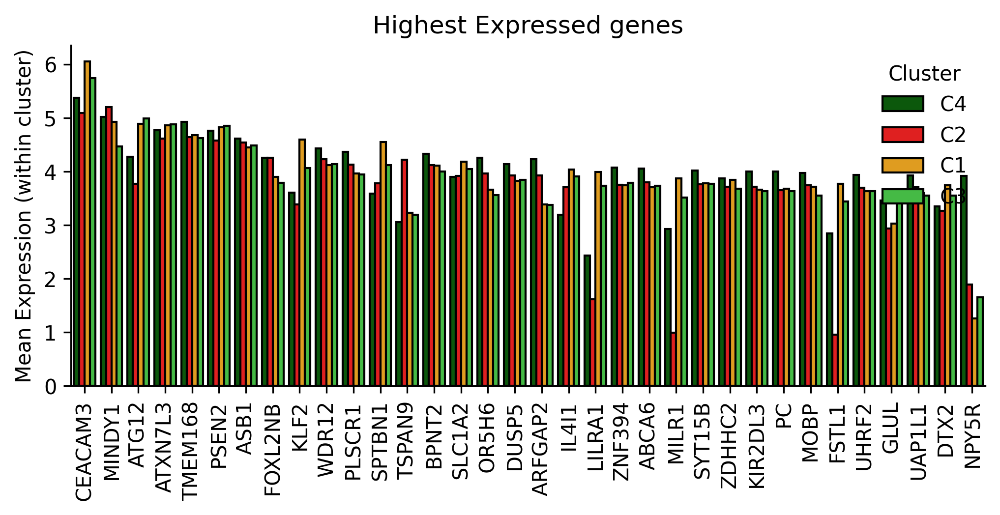

In [29]:
pdf = res.copy()
r_threshold = 25

# get the top ranked genes
top_genes = pdf[pdf['cluster_mean_rank'] < r_threshold]['gene_name'].to_list()
pdf = pdf[pdf['gene_name'].isin(top_genes)]
pdf = pdf.sort_values(by='cluster_mean_rank')

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 8, 3

sns.barplot(data=pdf, 
            x='gene_name',
            y='cluster_mean',
            hue='cluster',
            palette=colors,
            ec='k',
           )

plt.ylabel('Mean Expression (within cluster)')
plt.xlabel('')

plt.gca().tick_params(axis='x', rotation=90)
sns.move_legend(plt.gca(), 
                loc='upper right',
                title="Cluster",
                frameon=False)
plt.title("Highest Expressed genes")
sns.despine()
pdf.head()


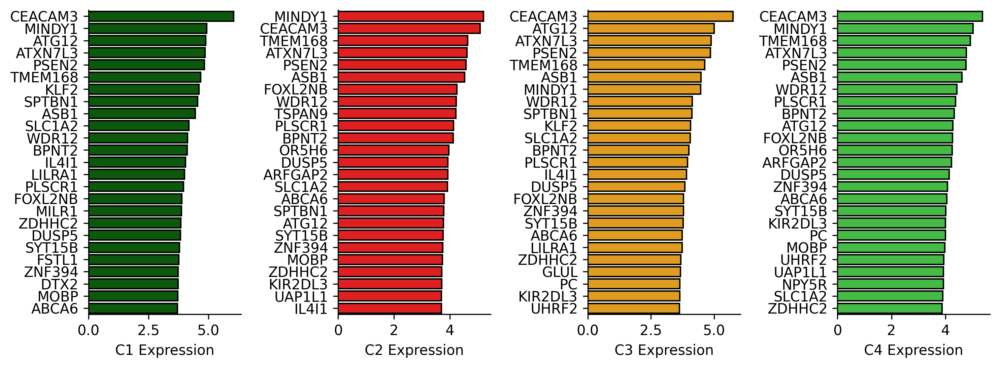

In [30]:
n = 25
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 10, 3.75
fig, axs = plt.subplots(1, 4)

for i, (cluster, group) in enumerate(res.groupby('cluster')):

    group = group.sort_values(by='cluster_mean_rank')

    sns.barplot(data=group.head(n), 
                x='cluster_mean',
                y='gene_name',
                color=colors[i],
                ec='k',
                ax=axs[i])

    axs[i].set_ylabel("")
    axs[i].set_xlabel(f"{cluster} Expression")


plt.tight_layout()
sns.despine()

In [31]:
# # genes with the largest difference in rank

# pdf = res.copy()
# pdf = pd.pivot_table(pdf, 
#                      index='gene_name',
#                      columns='cluster',
#                      values='cluster_mean_rank').reset_index(drop=False)

# pdf['diff'] = pdf['C1'] - pdf['C2']

# pdf = pdf.sort_values(by='diff')

# edf = gget.enrichr(pdf['gene_name'].head(100).to_list(), database='ontology')
# edf.head(10)


# # pdf.head(30)

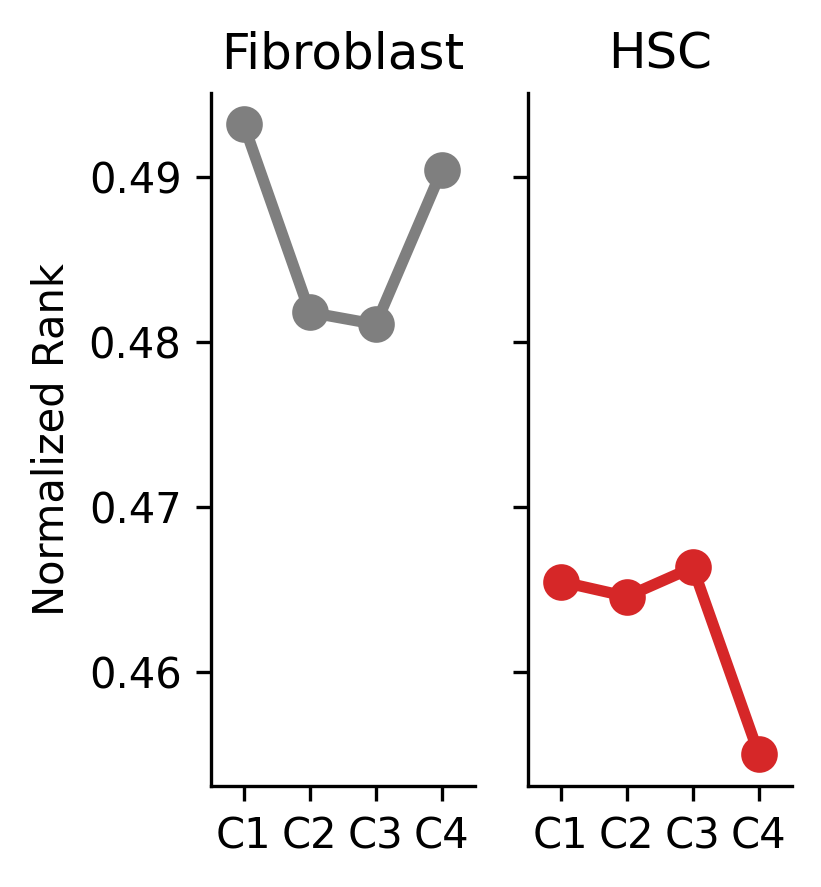

In [32]:
# what is the average rank of marker genes?
pdf = res.copy()

pdf['type'] = np.where(pdf['gene_name'].isin(fb), 'Fibroblast', 'NA')
pdf['type'] = np.where(pdf['gene_name'].isin(hp), 'HSC', pdf['type'])

# drop non-marker genes
pdf = pdf[pdf['type'] != 'NA']

marker_colors = ['C7', 'C3']


pdf = pdf.groupby(['cluster', 'type'])['cluster_mean_rank'].mean().reset_index()
pdf['cluster_mean_rank'] = pdf['cluster_mean_rank'] / res['gene_name'].nunique()

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 2.5, 3

fig, axs = plt.subplots(1, 2, sharey=True)

for i, (marker_type, group) in enumerate(pdf.groupby('type')):

    sns.pointplot(data=group, 
                x='cluster',
                y='cluster_mean_rank',
                hue='type',
                palette=[marker_colors[i]],
                ax=axs[i],)
                # ec='k')

    axs[i].legend().remove()
    axs[i].set_ylabel('Normalized Rank')
    axs[i].set_title(marker_type)
    axs[i].set_xlabel('')
    if not i == 0:
        axs[i].set_ylabel('')

    

sns.despine()
# # plt.yscale('log')
# plt.ylim([0.46, 0.51])
# plt.ylabel('Normalized Rank')
# plt.xlabel('')

# sns.move_legend(plt.gca(), 
#                 loc='upper right',
#                 title="Marker Genes",
#                 bbox_to_anchor=(1.2, 1.1),
#                 frameon=False)

,cluster,type,cluster_mean_rank
0,C1,Fibroblast,0.493184
1,C1,HSC,0.465489
2,C2,Fibroblast,0.481795
3,C2,HSC,0.464583
4,C3,Fibroblast,0.481071


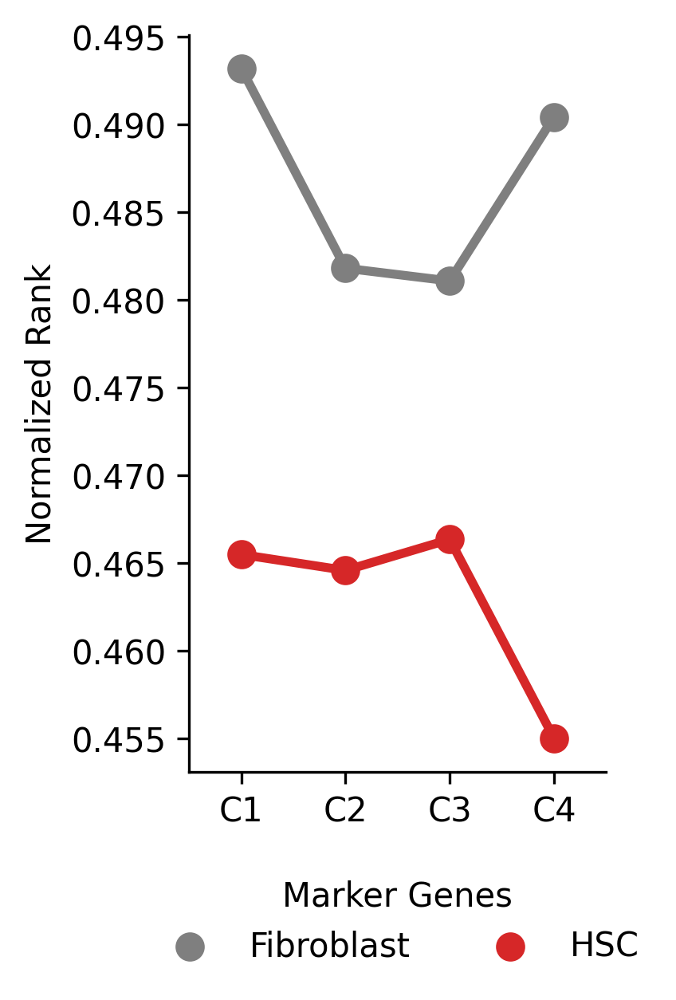

In [33]:
# what is the average rank of marker genes?
pdf = res.copy()

pdf['type'] = np.where(pdf['gene_name'].isin(fb), 'Fibroblast', 'NA')
pdf['type'] = np.where(pdf['gene_name'].isin(hp), 'HSC', pdf['type'])

# drop non-marker genes
pdf = pdf[pdf['type'] != 'NA']

marker_colors = ['C7', 'C3']


pdf = pdf.groupby(['cluster', 'type'])['cluster_mean_rank'].mean().reset_index()
pdf['cluster_mean_rank'] = pdf['cluster_mean_rank'] / res['gene_name'].nunique()

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 2.25, 4

sns.pointplot(data=pdf, 
              x='cluster',
              y='cluster_mean_rank',
              hue='type',
              palette=marker_colors,
              )

plt.ylabel('Normalized Rank')
plt.xlabel('')

sns.move_legend(plt.gca(), 
                loc='lower center',
                title="Marker Genes",
                ncol=2,
                bbox_to_anchor=(0.5, -0.3),
                frameon=False)

sns.despine()
pdf.head()

# Marker Plots

['CGAGAAGGTTACGATC', 'TTCAGGAAGTGAACAT', 'CACGTTCCAACTGTGT'] [5512, 7212, 7813]
X.shape=(8343, 189)


([], [])

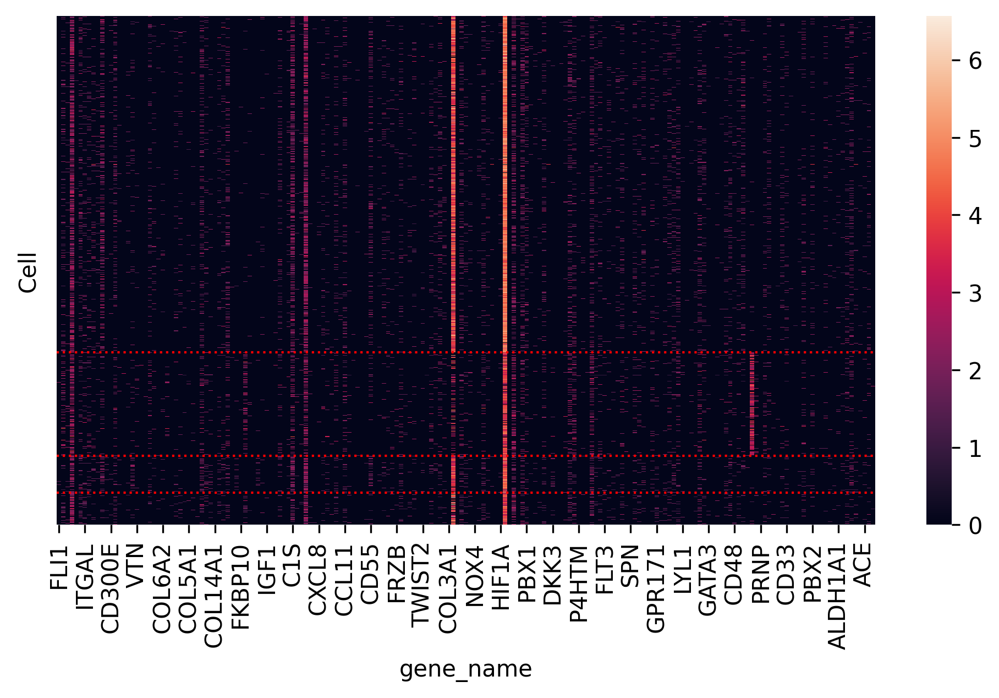

In [34]:
X = adata.copy()

# sort by cluster
clusters = X.obs.sort_values(by='clusters')
cluster_idx = clusters.index

# get the dividing line
cluster_boundary = clusters[clusters['clusters'].shift() != clusters['clusters']].index.to_list()[1:]
cluster_boundary_idx = [clusters.index.to_list().index(x) for x in cluster_boundary]

print(cluster_boundary, cluster_boundary_idx)

# get genes, unique only
overlap = set(fb).intersection(hp)
genes = [x for x in fb + hp if not x in overlap]

gene_info = X.var.copy()
gene_info = gene_info.reset_index(drop=False)
gene_info = gene_info.set_index('gene_name')

gene_info = gene_info.reindex(genes)
gene_info = gene_info[gene_info['gene_id'].notna()]
gene_idx = gene_info['gene_id'].to_list()

X = X[cluster_idx, gene_idx]

X = X.to_df()
X.columns = gene_info.index

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 6, 4

top = 50

print(f"{X.shape=}")


plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 8, 4

sns.heatmap(X, vmin=0,)

for c_idx in cluster_boundary_idx:
    plt.axhline(y=c_idx, c='r', lw=1, ls=":")

plt.ylabel("Cell")
plt.yticks([])

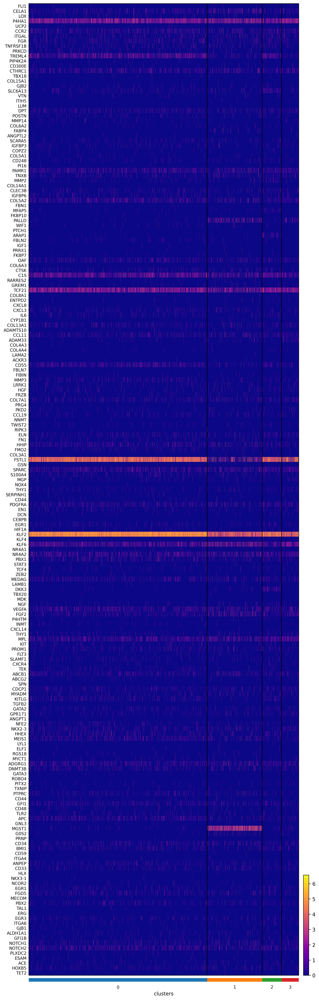

In [35]:
var_names = fb + hp
var_names = [x for x in var_names if x in adata.var['gene_name'].to_list()]

sc.pl.heatmap(adata,
              groupby='clusters',
              use_raw=False, 
              var_names=var_names,
              swap_axes=True, 
              show_gene_labels=True,
              gene_symbols='gene_name',
              vmin=0, 
              cmap='plasma')

In [36]:
# break

# most highly expressed genes

['CGAGAAGGTTACGATC', 'TTCAGGAAGTGAACAT', 'CACGTTCCAACTGTGT'] [5512, 7212, 7813]
Xhat.shape=(8343, 100)


,CEACAM3,MINDY1,ATXN7L3,PSEN2,TMEM168,ATG12,ASB1,SPTBN1,KLF2,WDR12,...,WTIP,CITED2,FMO1,SLC25A24,DEFB104A,PPIAL4D,ST6GALNAC4,BMP5,OXSR1,PBX4
cell_id,,,,,,,,,,,,,,,,,,,,,
AAACCCAAGGTTACCT,6.162341,4.722247,4.351589,4.257566,4.658302,5.241865,5.124743,4.722247,3.906940,4.257566,...,2.703210,2.074905,3.578477,2.074905,2.074905,2.074905,2.074905,3.086092,2.074905,2.074905
GGCGTCACATATGCGT,6.474821,5.770183,5.026428,5.080150,4.909465,5.270123,3.940855,5.629577,4.703526,4.339822,...,0.000000,3.545059,3.266953,0.000000,2.880370,2.880370,2.880370,2.241818,2.880370,2.880370
GGCGTCACAGGACTTT,6.017917,4.989298,5.121978,5.162561,4.655546,5.035509,4.348843,4.348843,5.162561,4.151040,...,2.700615,3.575773,3.083438,2.072473,3.083438,2.700615,0.000000,2.700615,2.072473,2.700615
GGCGTCACAGAGTCTT,6.027481,4.006548,5.292509,4.889555,5.055451,5.230313,4.744140,4.110087,3.891037,4.633937,...,2.564211,1.945225,2.564211,2.564211,0.000000,2.943681,2.564211,2.943681,1.945225,1.945225
GGCGTCACAATAACGA,5.970124,5.506273,5.102836,4.519901,4.700406,5.156583,4.415750,4.614221,4.614221,4.519901,...,0.000000,3.341021,0.000000,2.310816,2.310816,2.953102,2.953102,3.619814,3.837585,0.000000


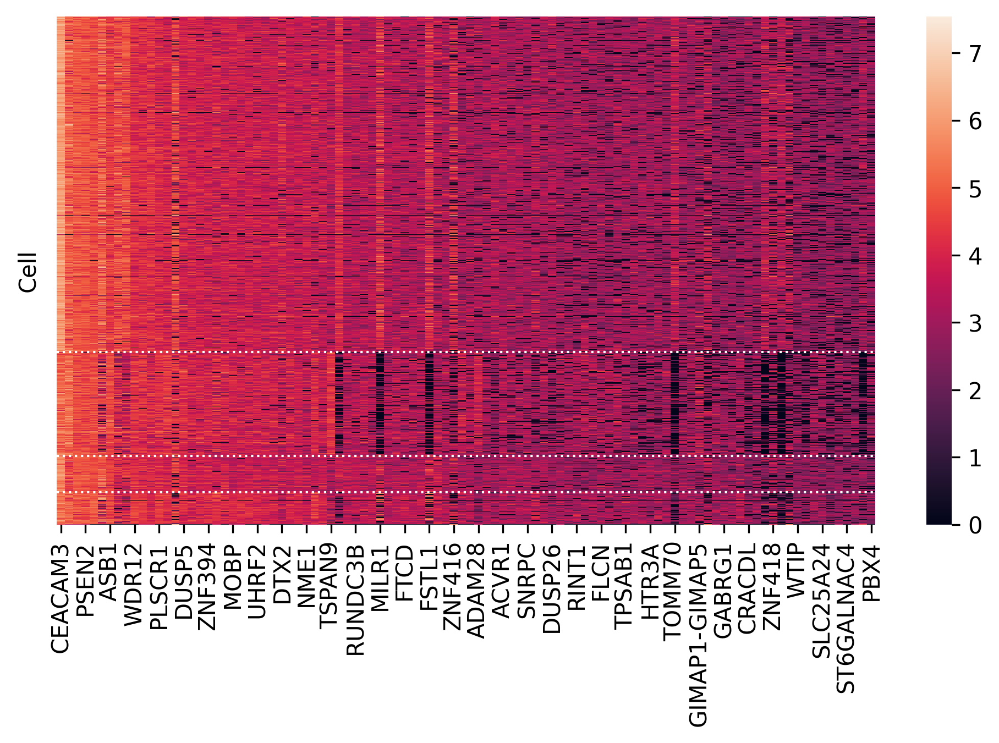

In [37]:
top_genes = 100
X = adata.copy()

# sort by cluster
clusters = X.obs.sort_values(by='clusters')
cluster_idx = clusters.index

# get the dividing line
cluster_boundary = clusters[clusters['clusters'].shift() != clusters['clusters']].index.to_list()[1:]
cluster_boundary_idx = [clusters.index.to_list().index(x) for x in cluster_boundary]

print(cluster_boundary, cluster_boundary_idx)

# sort by cluster
X = X[cluster_idx, :]

X = X.to_df()

# compute entropy
colsum = X.sum(axis=0)

edf = pd.DataFrame(colsum, columns=['expression'])
edf['gene_id'] = X.columns
edf['gene_name'] = edf['gene_id'].map(id2name)

edf = edf.sort_values(by='expression', ascending=False)


# subset the data
Xhat = X[edf['gene_id'].head(top_genes).to_list()]
Xhat.columns = edf['gene_name'].head(top_genes).to_list()

print(f"{Xhat.shape=}")

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 8, 4

sns.heatmap(Xhat, vmin=0,)
plt.ylabel("Cell")
plt.yticks([])

for c_idx in cluster_boundary_idx:
    plt.axhline(y=c_idx, c='w', lw=1, ls=":")

Xhat.head()

# most entropic genes

['CGAGAAGGTTACGATC', 'TTCAGGAAGTGAACAT', 'CACGTTCCAACTGTGT'] [5512, 7212, 7813]
Xhat.shape=(8343, 2000)


,CEACAM3,TMEM168,ATXN7L3,PSEN2,MINDY1,ASB1,WDR12,BPNT2,FOXL2NB,SLC1A2,...,TMEM158,WDR82,FRMD3,GPR161,ING2,FOXO3,POLR3G,SETD5,MAK16,THG1L
cell_id,,,,,,,,,,,,,,,,,,,,,
AAACCCAAGGTTACCT,0.000128,0.000119,0.000109,0.000107,0.000114,0.000137,0.000123,0.000134,0.000125,0.000118,...,0.00000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
GGCGTCACATATGCGT,0.000134,0.000126,0.000125,0.000128,0.000140,0.000105,0.000125,0.000103,0.000131,0.000127,...,0.00000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
GGCGTCACAGGACTTT,0.000125,0.000119,0.000128,0.000130,0.000121,0.000116,0.000120,0.000129,0.000125,0.000138,...,0.00000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
GGCGTCACAGAGTCTT,0.000125,0.000129,0.000132,0.000123,0.000097,0.000127,0.000133,0.000125,0.000129,0.000128,...,0.00000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
GGCGTCACAATAACGA,0.000124,0.000120,0.000127,0.000114,0.000133,0.000118,0.000130,0.000137,0.000089,0.000126,...,0.00144,0.0,0.0,0.0,0.0,0.0,0.001435,0.0,0.0,0.0


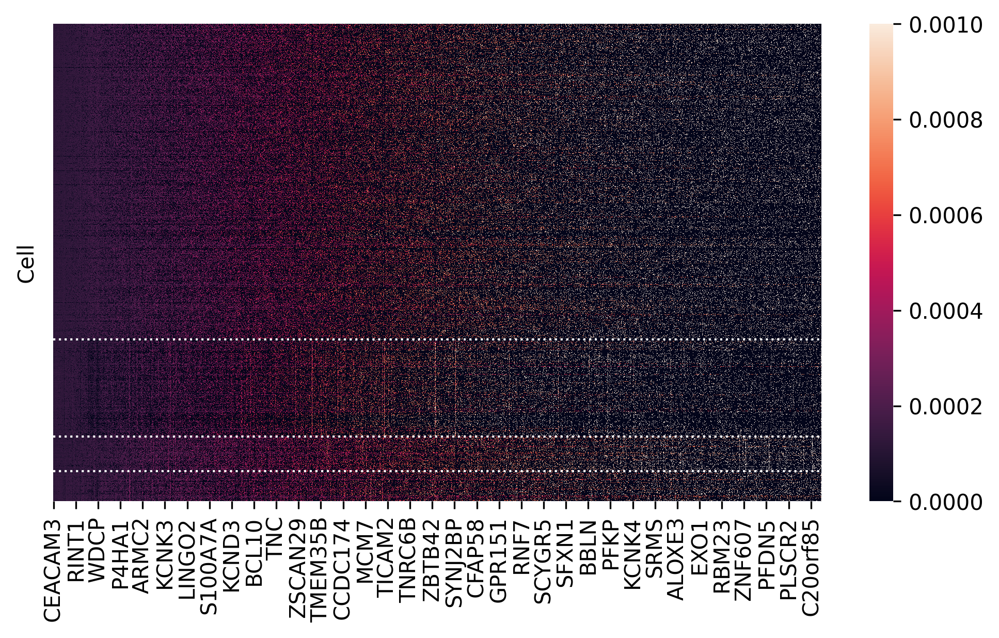

In [38]:
top_genes = 2000
X = adata.copy()

# sort by cluster
clusters = X.obs.sort_values(by='clusters')
cluster_idx = clusters.index

# get the dividing line
cluster_boundary = clusters[clusters['clusters'].shift() != clusters['clusters']].index.to_list()[1:]
cluster_boundary_idx = [clusters.index.to_list().index(x) for x in cluster_boundary]

print(cluster_boundary, cluster_boundary_idx)

# sort by cluster
X = X[cluster_idx, :]

X = X.to_df()

# compute entropy
colsum = X.sum(axis=0)
X = X.divide(colsum)
entropy = scipy.stats.entropy(X, axis=0)

edf = pd.DataFrame(entropy, columns=['entropy'])
edf['gene_id'] = X.columns
edf['gene_name'] = edf['gene_id'].map(id2name)

edf = edf.sort_values(by='entropy', ascending=False)


# subset the data
Xhat = X[edf['gene_id'].head(top_genes).to_list()]
Xhat.columns = edf['gene_name'].head(top_genes).to_list()

print(f"{Xhat.shape=}")

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 8, 4

sns.heatmap(Xhat, vmin=0, vmax=0.001)
plt.ylabel("Cell")
plt.yticks([])

for c_idx in cluster_boundary_idx:
    plt.axhline(y=c_idx, c='w', lw=1, ls=":")

Xhat.head()

# differential expression analysis

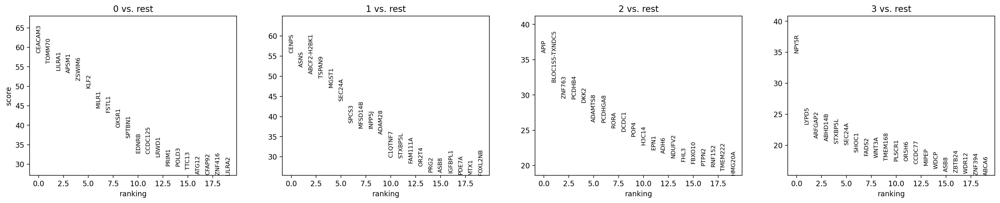

,group,names,scores,logfoldchanges,pvals,pvals_adj,gene_name
0,0,ENSG00000170956,58.576500,1.112525,0.0,0.0,CEACAM3
1,0,ENSG00000154174,55.822659,3.336628,0.0,0.0,TOMM70
2,0,ENSG00000104974,54.060604,2.702178,0.0,0.0,LILRA1
3,0,ENSG00000053770,53.412411,3.261716,0.0,0.0,AP5M1
4,0,ENSG00000130449,51.459305,3.096486,0.0,0.0,ZSWIM6


In [39]:
sc.tl.rank_genes_groups(adata, 'clusters', method='wilcoxon')

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 6, 4
sc.pl.rank_genes_groups(adata, 
                        n_genes=20, 
                        sharey=False, 
                        gene_symbols='gene_name')

deg = sc.get.rank_genes_groups_df(adata, 
                                  gene_symbols='gene_name',
                                  group=None)

deg.head()

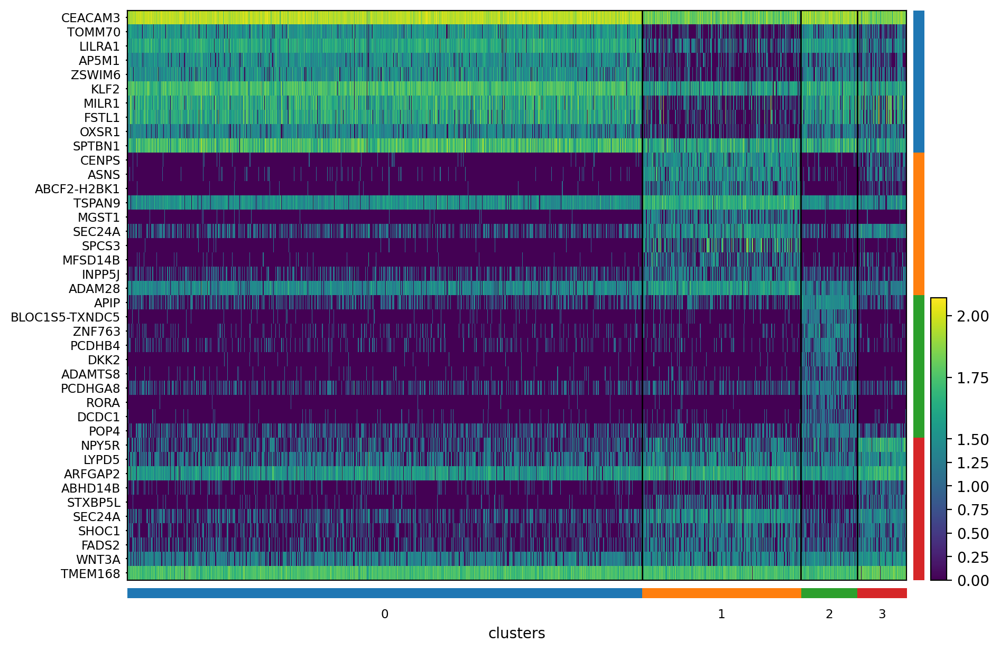

In [40]:
sc.pl.rank_genes_groups_heatmap(adata, 
                                n_genes=10, 
                                use_raw=False, 
                                dendrogram=False,
                                log=True,
                                groupby='clusters',
                                swap_axes=True, 
                                show_gene_labels=True,
                                vcenter=1.5,
                                gene_symbols='gene_name',
                                cmap='viridis')

# Cell type predictions

In [59]:
alpha = 0.05
n_query = 10
lfc_threshold = 0.0

for cluster, group in deg.groupby('group'):
    group = group[group['pvals_adj'] <= alpha]
    group = group[group['logfoldchanges'] > lfc_threshold]
    group = group.sort_values(by='logfoldchanges', ascending=False)
    group = group.head(n_query)

    gene_list = group['gene_name'].to_list()
    edf = gget.enrichr(gene_list, database='celltypes')
    print(edf.head())
    pass
    

Fri Dec 22 10:26:40 2023 INFO Performing Enichr analysis using database PanglaoDB_Augmented_2021. 
    Please note that there might be a more appropriate database for your application. 
    Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
    
Fri Dec 22 10:26:41 2023 INFO Performing Enichr analysis using database PanglaoDB_Augmented_2021. 
    Please note that there might be a more appropriate database for your application. 
    Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
    


   rank                   path_name     p_val    z_score  combined_score  \
0     1         Loop Of Henle Cells  0.002323  34.215517      207.514658   
1     2                  Mast Cells  0.005814  21.198498      109.120213   
2     3            His Bundle Cells  0.047944  22.786942       69.220449   
3     4                  Osteocytes  0.047944  22.786942       69.220449   
4     5  Airway Smooth Muscle Cells  0.048422  22.553288       68.286758   

  overlapping_genes  adj_p_val                  database  
0     [MAOB, FSTL1]   0.095333  PanglaoDB_Augmented_2021  
1     [MILR1, MAOB]   0.095333  PanglaoDB_Augmented_2021  
2           [FSTL1]   0.095333  PanglaoDB_Augmented_2021  
3           [FSTL1]   0.095333  PanglaoDB_Augmented_2021  
4           [FSTL1]   0.095333  PanglaoDB_Augmented_2021  


Fri Dec 22 10:26:41 2023 INFO Performing Enichr analysis using database PanglaoDB_Augmented_2021. 
    Please note that there might be a more appropriate database for your application. 
    Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
    


   rank                                     path_name     p_val    z_score  \
0     1                                   Neuroblasts  0.070663  15.206897   
1     2  Erythroid-like And Erythroid Precursor Cells  0.073935  14.501462   
2     3                      Hematopoietic Stem Cells  0.085537  12.437539   
3     4                                       B Cells  0.087381  12.160221   
4     5                                     Podocytes  0.088302  12.026108   

   combined_score overlapping_genes  adj_p_val                  database  
0       40.295708           [PROS1]   0.088302  PanglaoDB_Augmented_2021  
1       37.770002            [ASNS]   0.088302  PanglaoDB_Augmented_2021  
2       30.581495           [MGST1]   0.088302  PanglaoDB_Augmented_2021  
3       29.640248           [SPCS3]   0.088302  PanglaoDB_Augmented_2021  
4       29.187287           [PROS1]   0.088302  PanglaoDB_Augmented_2021  


Fri Dec 22 10:26:41 2023 INFO Performing Enichr analysis using database PanglaoDB_Augmented_2021. 
    Please note that there might be a more appropriate database for your application. 
    Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
    


   rank                path_name     p_val    z_score  combined_score  \
0     1         His Bundle Cells  0.047944  22.786942       69.220449   
1     2               Osteocytes  0.047944  22.786942       69.220449   
2     3   Trophoblast Stem Cells  0.048422  22.553288       68.286758   
3     4  Kidney Progenitor Cells  0.051288  21.245726       63.106181   
4     5   Enterochromaffin Cells  0.053194  20.454733       60.010268   

  overlapping_genes  adj_p_val                  database  
0            [ENAH]   0.095465  PanglaoDB_Augmented_2021  
1            [ENAH]   0.095465  PanglaoDB_Augmented_2021  
2            [ENAH]   0.095465  PanglaoDB_Augmented_2021  
3            [ENAH]   0.095465  PanglaoDB_Augmented_2021  
4           [LMX1A]   0.095465  PanglaoDB_Augmented_2021  
   rank                   path_name     p_val    z_score  combined_score  \
0     1                    Myocytes  0.002846  30.790373      180.489777   
1     2                   Podocytes  0.003609  27.20879

In [55]:
group.head()

,group,names,scores,logfoldchanges,pvals,pvals_adj,gene_name
42093,3,ENSG00000122566,4.551074,4.775425,5.337290e-06,2.150496e-04,HNRNPA2B1
41869,3,ENSG00000128923,11.496326,4.222479,1.376505e-30,3.252517e-28,MINDY2
41907,3,ENSG00000170802,9.494075,4.010005,2.221753e-21,2.790401e-19,FOXN2
41823,3,ENSG00000164129,34.900951,3.953623,7.191844e-267,1.002615e-262,NPY5R
41861,3,ENSG00000212807,12.254333,3.900860,1.592528e-34,4.440287e-32,OR2A42


edf.shape=(3874, 8)


,group,type,rank,cluster
0,0,Fibroblast,0.199849,C1
1,0,HSC,0.332578,C1
3,1,Fibroblast,0.399987,C2
4,1,HSC,0.290282,C2
6,2,Fibroblast,0.301057,C3


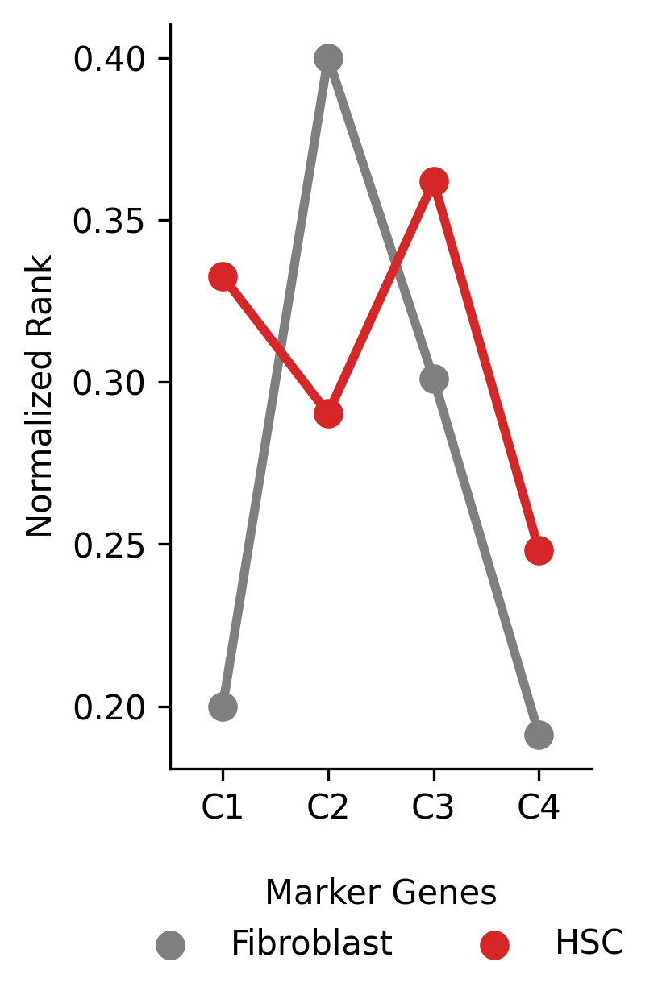

In [41]:
edf = deg.copy()
ubiquity_threshold = 0.1
alpha = 0.05

edf['type'] = np.where(edf['gene_name'].isin(fb), 'Fibroblast', 'NA')
edf['type'] = np.where(edf['gene_name'].isin(hp), 'HSC', edf['type'])

edf = edf[(edf['pvals_adj'] < alpha)]

# unbiquity thresholding
print(f"{edf.shape=}")

genes = edf['names'].to_list()
perc_expressing = adata[:, genes].X.astype(bool).astype(int)
perc_expressing = perc_expressing.sum(axis=0)
edf['perc_expressing'] = perc_expressing / len(adata)
edf = edf[edf['perc_expressing'] > ubiquity_threshold]


# rank genes within group
edf['rank'] = edf.groupby('group')['logfoldchanges'].transform('rank', ascending=False)

n_genes = edf['gene_name'].nunique()

# get the average rank
edf = edf.groupby(['group', 'type'])['rank'].mean().reset_index()
edf = edf[edf['type'] != 'NA']
edf['cluster'] = edf['group'].apply(lambda x: f"C{int(x)+1}")

# normalize the rank
edf['rank'] = edf['rank'] / n_genes


plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 2.25, 4

sns.pointplot(data=edf, 
              x='cluster',
              y='rank',
              hue='type',
              palette=marker_colors,
              )

plt.ylabel('Normalized Rank')
plt.xlabel('')

sns.move_legend(plt.gca(), 
                loc='lower center',
                title="Marker Genes",
                ncol=2,
                bbox_to_anchor=(0.5, -0.3),
                frameon=False)

sns.despine()

plt.gca().set_facecolor('None')
plt.gca().set_alpha(0.0)

edf.head()

edf.shape=(3087, 7)


,group,names,scores,logfoldchanges,pvals,pvals_adj,gene_name,perc_expressing,type
149,0,ENSG00000176422,7.226735,2.788295,4.947457e-13,1.959446e-11,SPRYD4,0.085341,NA
17,0,ENSG00000114656,27.330551,2.589581,1.839124e-164,7.769461e-162,CFAP92,0.380918,NA
189,0,ENSG00000100024,5.743974,2.529284,9.248006e-09,2.748965e-07,UPB1,0.071917,NA
50,0,ENSG00000069535,18.516003,2.518574,1.534154e-76,2.430414e-74,MAOB,0.246674,NA
217,0,ENSG00000139668,4.943541,2.470745,7.671641e-07,1.909828e-05,WDFY2,0.061968,NA
12,0,ENSG00000161036,31.898712,2.348821,2.782207e-223,1.939337e-220,LRWD1,0.497543,NA
89,0,ENSG00000179455,10.413074,2.322917,2.161272e-25,1.448572e-23,MKRN3,0.138919,NA
13945,1,ENSG00000008394,47.152512,7.557302,0.000000e+00,0.000000e+00,MGST1,0.170322,HSC
13947,1,ENSG00000129128,38.387009,6.855701,0.000000e+00,0.000000e+00,SPCS3,0.149706,NA
13943,1,ENSG00000285292,50.539135,6.783641,0.000000e+00,0.000000e+00,ABCF2-H2BK1,0.199928,NA


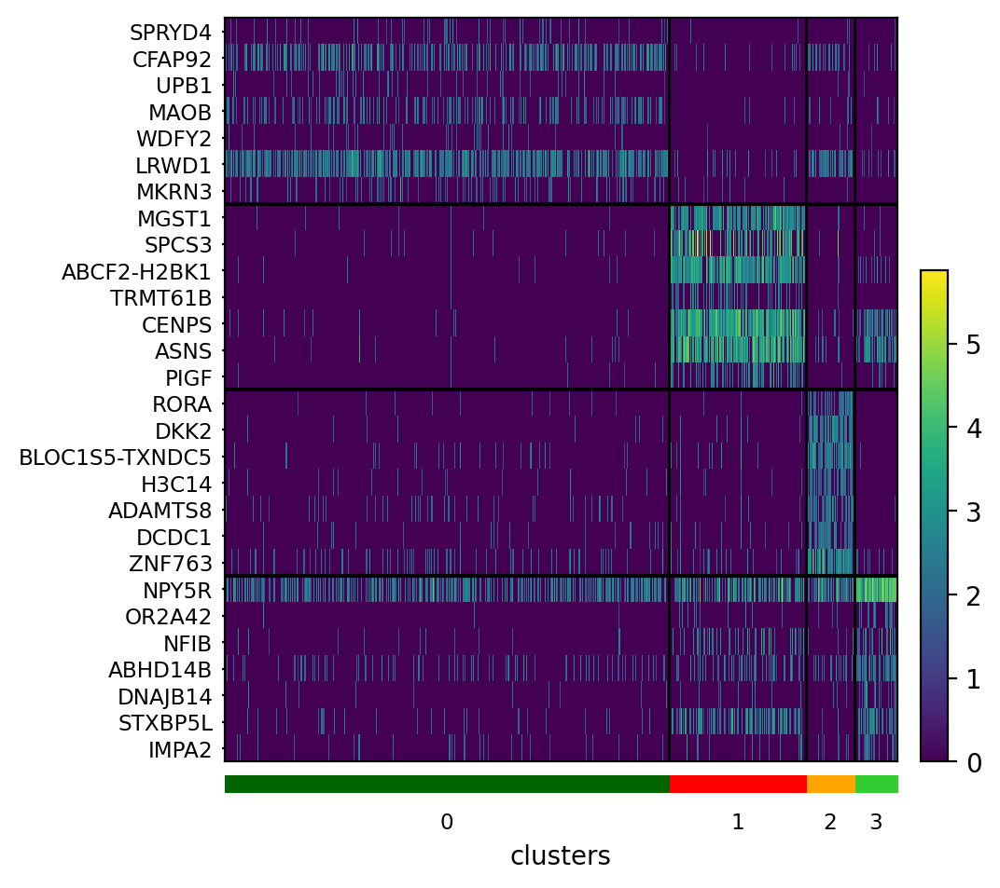

In [42]:
top = 7
alpha = 0.01
ubiquity_threshold = 0.05
ubiquity_threshold_upper = 0.75
edf = deg.copy()

# set the colors for the bars underneath (STUPID)
adata.uns['clusters_colors'] = colors 

edf = edf[(edf['pvals_adj'] < alpha)]

# unbiquity thresholding
print(f"{edf.shape=}")

genes = edf['names'].to_list()
perc_expressing = adata[:, genes].X.astype(bool).astype(int)
perc_expressing = perc_expressing.sum(axis=0)
edf['perc_expressing'] = perc_expressing / len(adata)
edf = edf[edf['perc_expressing'] > ubiquity_threshold]
edf = edf[edf['perc_expressing'] < ubiquity_threshold_upper]

# sorting and subsetting the top genes
edf = edf.sort_values(by=['group', 'logfoldchanges'], ascending=[True, False])
edf = edf.groupby('group').head(top)

edf['type'] = np.where(edf['gene_name'].isin(fb), 'Fibroblast', 'NA')
edf['type'] = np.where(edf['gene_name'].isin(hp), 'HSC', edf['type'])

var_names = edf['gene_name'].to_list()

plt.rcParams['figure.dpi'] = 200

ax = sc.pl.heatmap(adata,
              groupby='clusters',
              figsize=(5, 5.5),
              use_raw=False, 
              var_names=var_names,
              swap_axes=True, 
              show=False,
              # standard_scale=True,
              show_gene_labels=True,
              gene_symbols='gene_name',
              cmap='viridis')

ax['heatmap_ax'].axhline(y=top-0.5, c='k')
ax['heatmap_ax'].axhline(y=(2*top)-0.5, c='k')
ax['heatmap_ax'].axhline(y=(3*top)-0.5, c='k')
edf

# HSC pathways

In [43]:
dpath = "/nfs/turbo/umms-indikar/shared/projects/HSC/data/GO_annotations/"

hdf = []

for f in os.listdir(dpath):
    fpath = f"{dpath}{f}"
    tmp = pd.read_csv(fpath, sep='\t')
    hdf.append(tmp)

hdf = pd.concat(hdf)
hdf.head()

,GENE PRODUCT DB,GENE PRODUCT ID,SYMBOL,QUALIFIER,GO TERM,GO NAME,ECO ID,GO EVIDENCE CODE,REFERENCE,WITH/FROM,TAXON ID,ASSIGNED BY,ANNOTATION EXTENSION,GO ASPECT
0,UniProtKB,A0A024R9N2,FANCC,involved_in,GO:0097150,neuronal stem cell population maintenance,ECO:0000265,IEA,GO_REF:0000107,UniProtKB:P50652|ensembl:ENSMUSP00000124406,9606,Ensembl,NaN,P
1,UniProtKB,A0A024RAW0,MED21,involved_in,GO:0035019,somatic stem cell population maintenance,ECO:0000265,IEA,GO_REF:0000107,UniProtKB:Q9CQ39|ensembl:ENSMUSP00000032429,9606,Ensembl,NaN,P
2,UniProtKB,A0A0P1J1R0,seTCTP,involved_in,GO:0019827,stem cell population maintenance,ECO:0000265,IEA,GO_REF:0000107,UniProtKB:P63028|ensembl:ENSMUSP00000106519,9606,Ensembl,NaN,P
3,UniProtKB,A0A0S2Z590,LSM1,involved_in,GO:0019827,stem cell population maintenance,ECO:0000265,IEA,GO_REF:0000107,UniProtKB:Q8VC85|ensembl:ENSMUSP00000041022,9606,Ensembl,NaN,P
4,UniProtKB,A0A384MR33,SMC1L1,involved_in,GO:0035019,somatic stem cell population maintenance,ECO:0000265,IEA,GO_REF:0000107,UniProtKB:Q9CU62|ensembl:ENSMUSP00000044645,9606,Ensembl,NaN,P


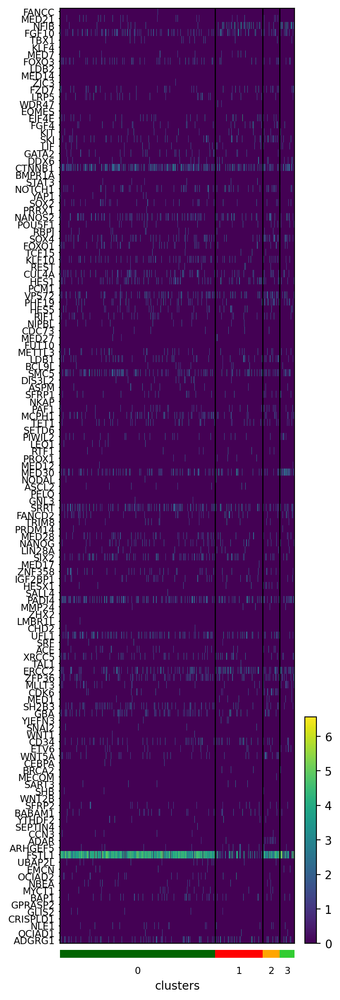

In [44]:
var_names = list(hdf['SYMBOL'].unique())
var_names = [x for x in var_names if x in adata.var['gene_name'].to_list()]

ax = sc.pl.heatmap(adata,
              groupby='clusters',
              figsize=(4, 15),
              use_raw=False, 
              var_names=var_names,
              swap_axes=True, 
              show=False,
              standard_scale=True,
              show_gene_labels=True,
              gene_symbols='gene_name',
              cmap='viridis')

# Write the Data

In [47]:
outpath = "/scratch/indikar_root/indikar1/cstansbu/all_scHSC_run4/scanpy/anndata_distance.h5ad"
adata.write(outpath)
print('done')

done


In [46]:
break

SyntaxError: 'break' outside loop (668683560.py, line 1)

In [ ]:
# hdf.head()

In [ ]:
# # enrichments for each cluster

# alpha = 0.05
# fc_threshold = 0.0
# n_query = 10

# # db = 'ontology'
# # db = 'TRRUST_Transcription_Factors_2019'
# db = 'PanglaoDB_Augmented_2021'

# for cluster, group in deg.groupby('group'):

#     group = group[group['pvals_adj'] < alpha]
#     group = group[group['logfoldchanges'].abs() > fc_threshold]
#     group = group.reset_index(drop=True)

#     group = group.sort_values(by='logfoldchanges', ascending=False)
#     group = group.head(n_query)

#     gene_names = adata.var.loc[group['names'].to_list()]['gene_name'].to_list()
#     print(gene_names)
    
#     # edf = gget.enrichr(gene_names, database=db)
#     # print(edf[['path_name', 'adj_p_val', 'overlapping_genes']].head(10))
    
#     # print()

In [ ]:
# edf = gget.enrichr(gene_names, database=db)

In [ ]:
break

# Pathway analysis

In [ ]:
def parseKEGG(pathId):
    genes = []
    results = REST.kegg_get(pathId).read()
    current_section = None
    for line in results.rstrip().split("\n"):
        section = line[:12].strip()  # section names are within 12 columns
        if not section == "":
            current_section = section

        if current_section == "GENE":
            linesplit = line[12:].split("; ")
            gene_identifiers = linesplit[0]
            gene_id, gene_symbol = gene_identifiers.split()
    
            if not gene_symbol in genes:
                genes.append(gene_symbol)
    return genes

def getPathname(pathId):
    """A function to return the legg pathname"""
    result = REST.kegg_list(pathId).read()
    return result.split("\t")[1].split("-")[0].strip()


pid = "04110"
pgenes = parseKEGG(f"hsa{pid}")
pname = getPathname(f"hsa{pid}")
print(pname)
print(pgenes)

In [ ]:
pids = [
    "04110", 
    "03022", 
    "03020",
    "04310",
    "04330",
    "04115",
    "04218",
    "04810",
    "04710",
    "04713",
]

exp_genes = adata.var['gene_name'].to_list()

pways = {}

for pid in pids:
    pgenes = parseKEGG(f"hsa{pid}")
    pname = getPathname(f"hsa{pid}")
    gene_list = [x for x in pgenes if x in exp_genes]
    print(f"{pname} ({pid}) has {len(pgenes)} genes, {len(gene_list)} expressed")
    pways[pname] = gene_list

print('done')

In [ ]:
for pathway, gene_list in pways.items():
    gene_ids = adata.var[adata.var['gene_name'].isin(gene_list)].index
    adata.obs[f"{pathway}_mean"] = adata[:, gene_ids].X.mean(axis=1)
    adata.obs[f"{pathway}_median"] = np.median(adata[:, gene_ids].X, axis=1)
    adata.obs[f"{pathway}_max"] = adata[:, gene_ids].X.max(axis=1)
    
print('done')

In [ ]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 15, 7

pdf = adata.obs.copy()
fig, axs = plt.subplots(2, 5)
axs = axs.ravel()

for i, pathway in enumerate(pways.keys()):
    column_name = f"{pathway}_max"

    # sort order
    order = np.argsort(pdf[column_name])

    sns.scatterplot(data=pdf.iloc[order], 
                    x='UMAP 1',
                    y='UMAP 2',
                    hue=column_name,
                    palette=cmap,
                    alpha=0.9,
                    ax=axs[i],
                    s=5,
                    # hue_norm=(0, 0.2),
                    ec='none')

    axs[i].set_yticks([])
    axs[i].set_xticks([])
    axs[i].legend().remove()
    axs[i].set_title(pathway)

sns.despine()
plt.tight_layout()

# Write data

In [ ]:
outpath = "/nfs/turbo/umms-indikar/shared/projects/HSC/data/single-cell/nov2023_run1/scanpy/anndata_processed.h5ad"
adata.write(outpath)

print('done')

# Some calulcations from flow

In [ ]:
simul = [97.1, 96.3, 97.0]
print(np.mean(simul))
print(np.std(simul))

serial = [84.1, 87.2, 85.2]
print(np.mean(serial))
print(np.std(serial))

both = [84.1, 87.2, 85.2]
print(np.mean(serial))
print(np.std(serial))



In [ ]:

recipe = ['FH3', 'FH3', 'FH6', 'FH6',  'FH7',  'FH7', 'FH8', 'FH8',]
mois = ['Low', 'High'] * 4
CD34 = [1.17, 2.08, 3.33, 1.70, 2.73, 2.09, 3.39, 1.86]

df = pd.DataFrame({
     'Recipe' : recipe,
     'MOI' : mois,
})

df

In [ ]:
gx = df.groupby([''])

In [ ]:

recipe = ['FH3', 'FH3', 'FH6', 'FH6',  'FH7',  'FH7', 'FH8', 'FH8',]
mois = ['Low', 'High'] * 4
CD34 = [1.17, 2.08, 3.33, 1.70, 2.73, 2.09, 3.39, 1.86]

df = pd.DataFrame({
     'Recipe' : recipe,
     'MOI' : mois,
})

df